# Camera calibration (distortion correction) tutorial

Made by: Anna Casto

Updated: April 26, 2024

Some cameras create distortions (e.g. fisheye) that get in the way of accurate computer vision measurements. These camera calibration functions use images of checkerboards to correct camera distortions. Once a camera has been calibrated, it is possible to use the outputs of the *checkerboard_calib* function to correct any images taken with that camera.

# Section 1: Importing Image and Libraries

In [1]:
# Set the notebook display method
# If widget is not working, then change to inline
%matplotlib widget

# Import libraries
from plantcv import plantcv as pcv
from plantcv.parallel import WorkflowInputs

# Print out the version of PlantCV being used by the Jupyter kernel
pcv.__version__

'4.8.dev10+g6eebf6ab'

In [2]:
# Set debug to the global parameter 
pcv.params.debug = "plot"
# Change display settings
pcv.params.dpi = 100
pcv.params.text_size = 20
pcv.params.text_thickness = 20

### Read in checkerboard images and calibrate camera
It is recommended to use > 10 images of the same checkerboard placed in different areas of the field of view, as shown in the examples below. Make sure all checkerboard squares are at least partially within frame. Checkerboards should be at least 6 x 6 squares.

<img src="./img/checkerboard_imgdir/checkerboard4.png" alt="example 1" width="450"/>
<img src="./img/checkerboard_imgdir/checkerboard2.png" alt="example 2" width="450"/>

It is also important to make sure you are counting the column and row corners correctly. Count the *inner corners* of the checkerboard squares rather than the squares themselves. In the example image below, the counted corners are indicated by the colored dots. In this case there are 13 corners per column and 19 corners per row.

![Checkerboard corner counting example](./img/corner_example.png)

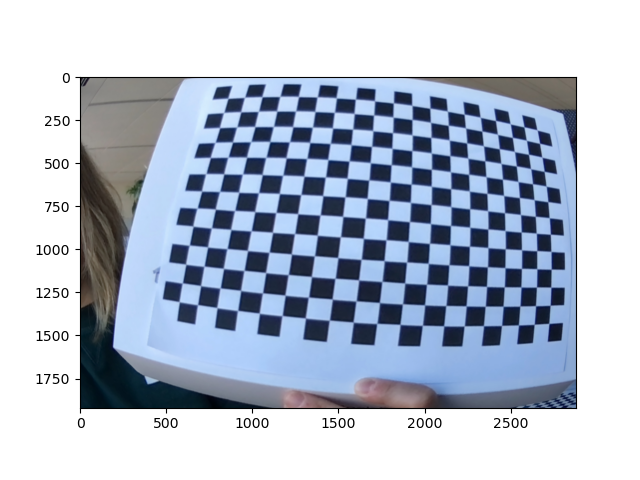

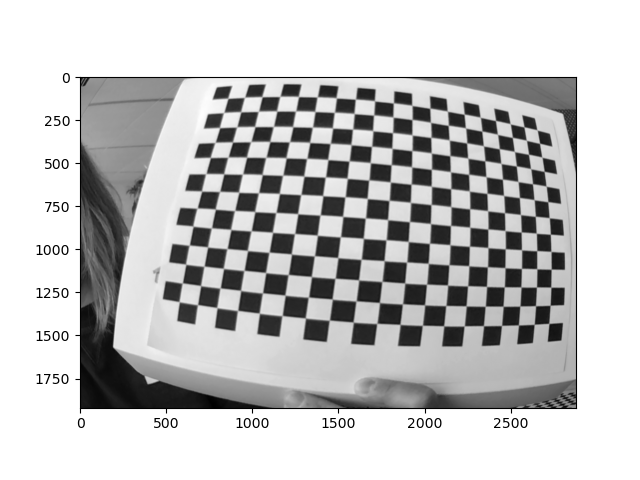

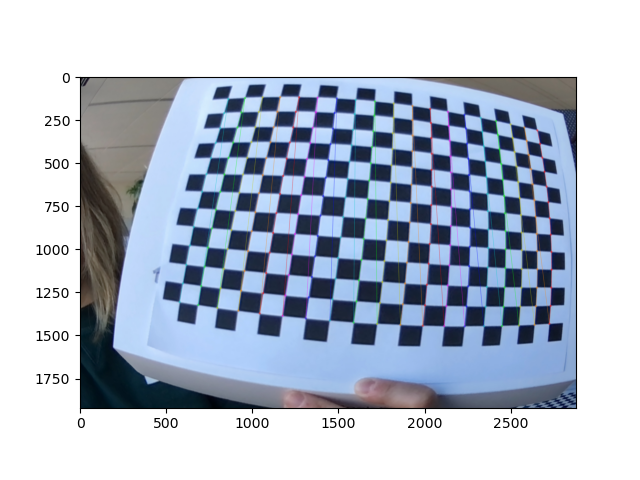

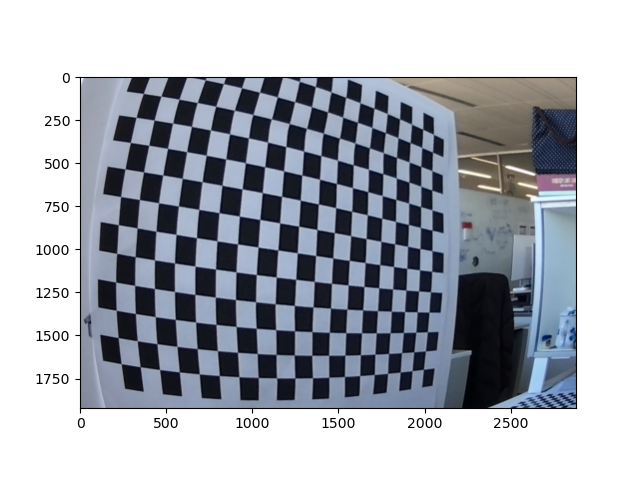

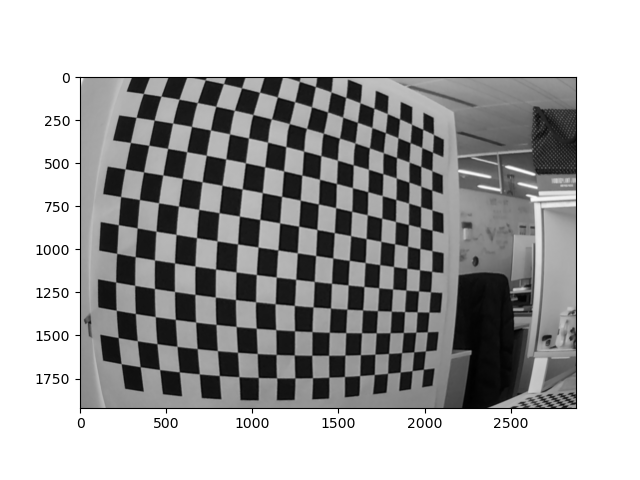

Checkerboard image bad_checkerboard.png does not match given dimensions.


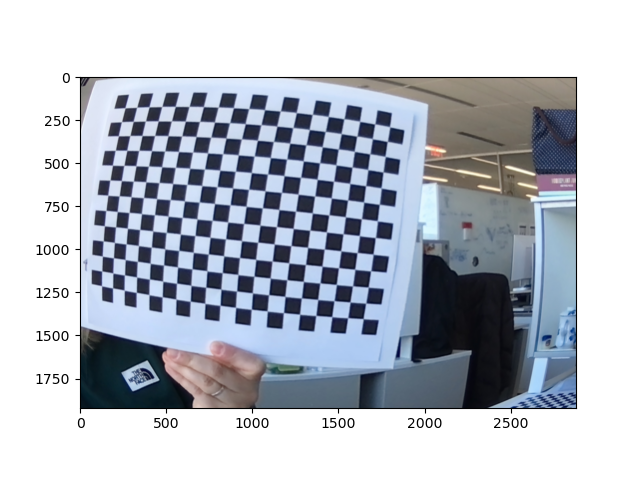

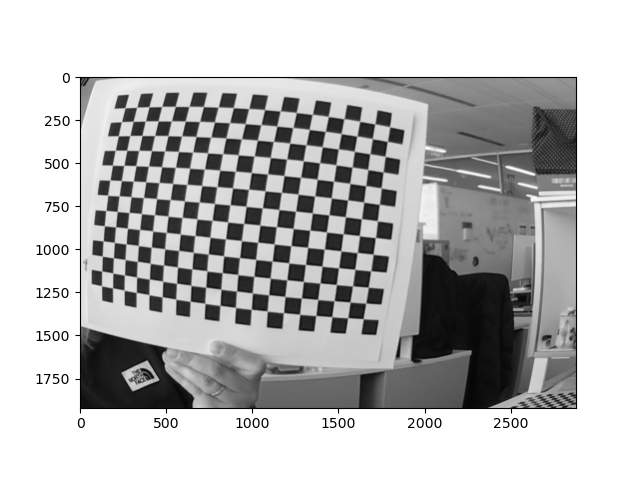

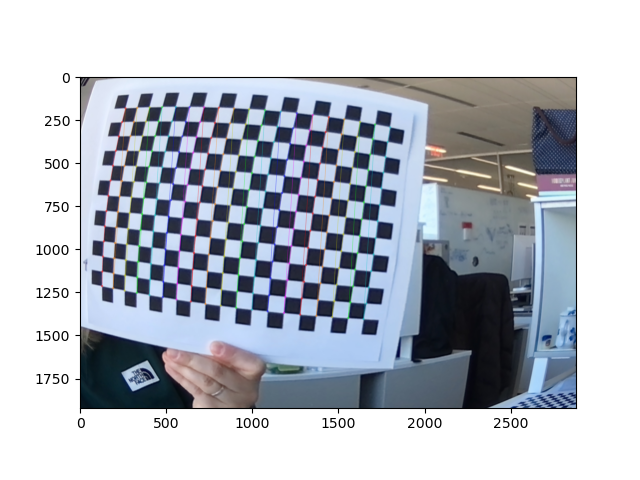

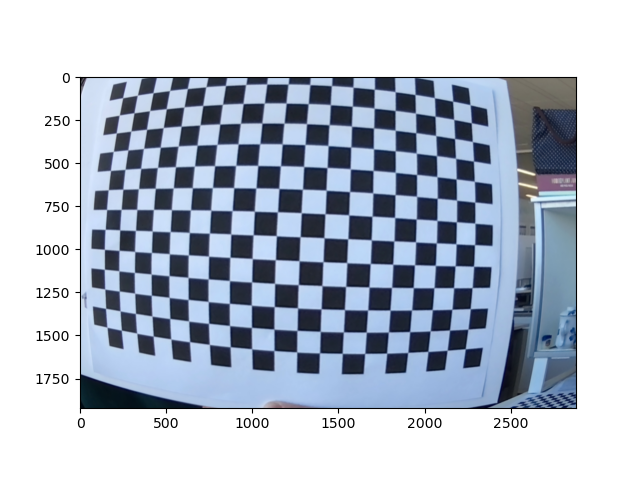

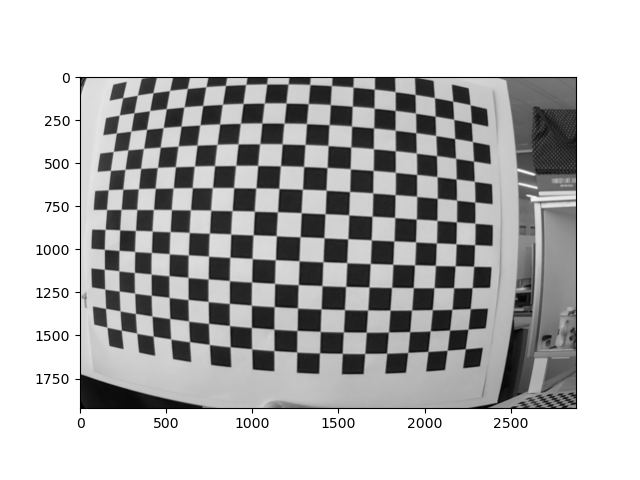

...

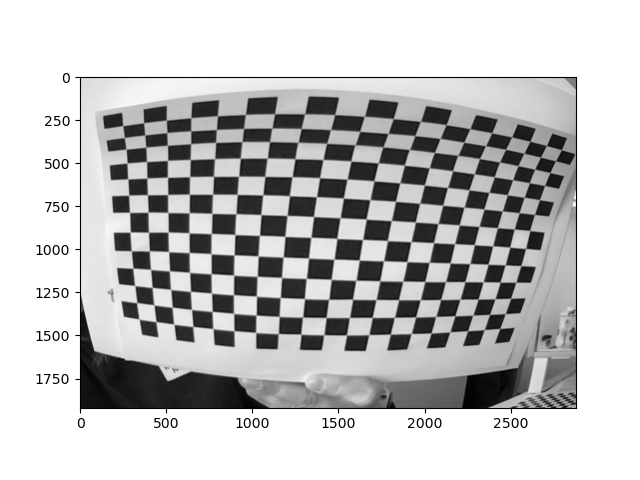

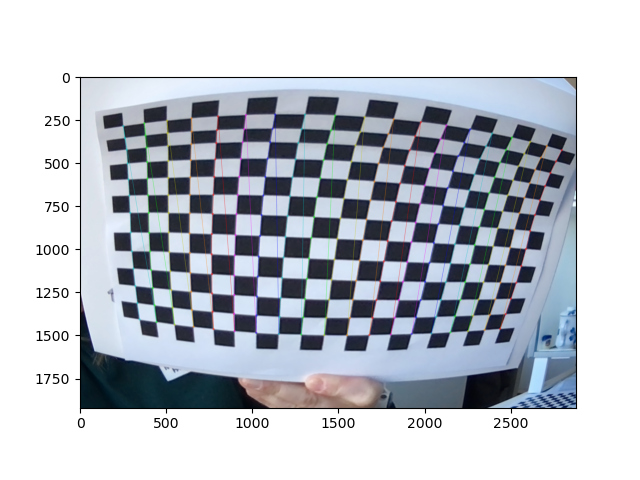

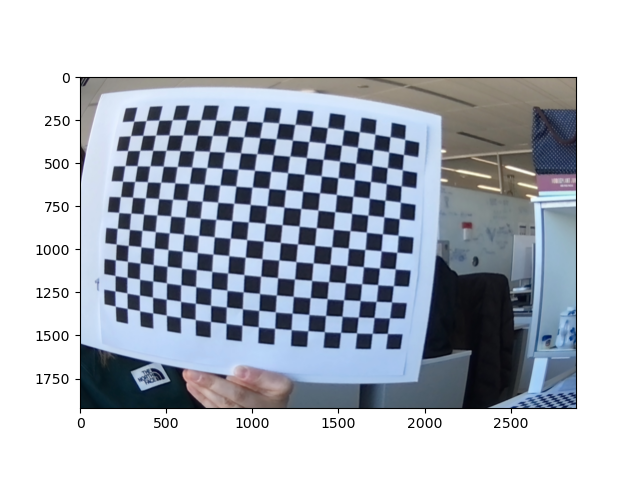

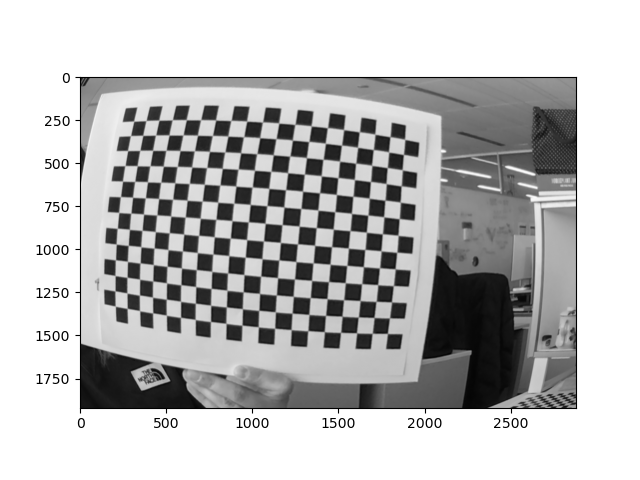

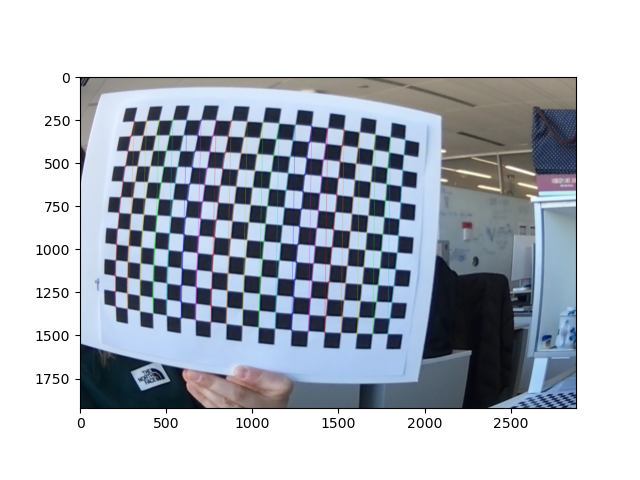

In [8]:
mtx, dist = pcv.transform.checkerboard_calib(img_path = "./img/checkerboard_imgdir/", col_corners = 13, row_corners = 19, out_dir = "./")

## Input/Output variables

The options class mimics the workflow command-line argument parser that is used for workflow parallelization. Using it while developing a workflow in Jupyter makes it easier to convert the workflow to a script later. Remember, always keep your raw images separate from your newly processed images!

In [4]:
# Input/output options
args = WorkflowInputs(
    images=["./img/fisheye_test_img.jpg"],
    names="image",
    result="example_results.json",
    outdir=".",
    writeimg=False,
    debug="plot"
    )

## Read in the distorted image

### Reading images into your environment using *pcv.readimage()*
Inputs:
   * filename = Image file to be read in
   * mode     = How the image will be read into the notebook; either 'native' (default), 'rgb', 'gray', 'csv', or 'envi'

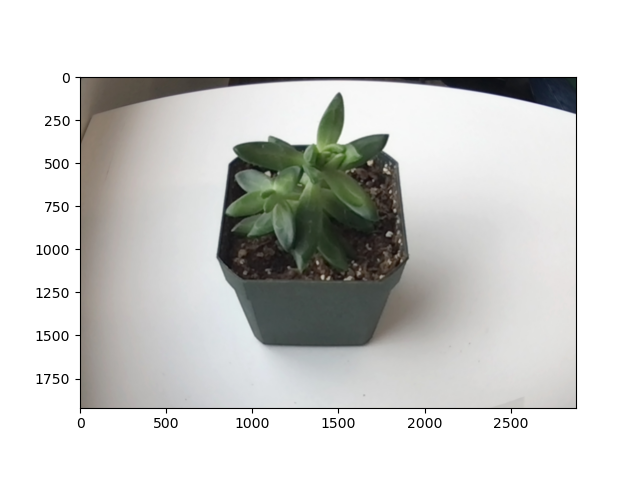

In [5]:
img, path, fname = pcv.readimage(filename= args.image, mode="native")

### Correct image

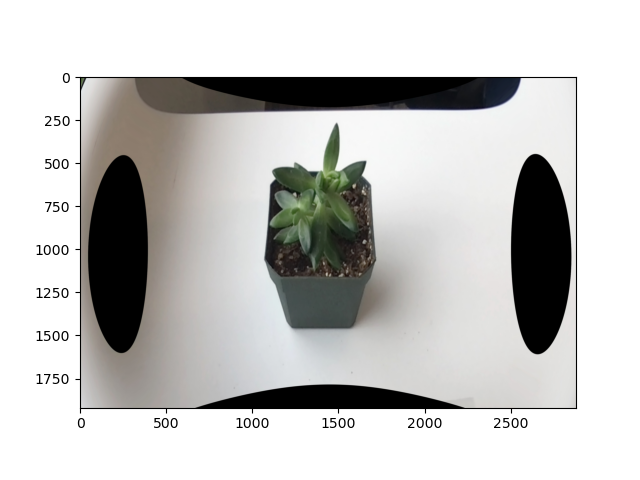

In [6]:
corrected_img = pcv.transform.calibrate_camera(rgb_img=img, mtx_filename = "mtx.npz", dist_filename = "dist.npz")

The corrected image can now be analyzed using standard workflow steps like [Simple RGB workflow tutorial](https://plantcv.readthedocs.io/en/latest/tutorials/simple_RGB_workflow_tutorial/) or [Single plant RGB workflow tutorial](https://plantcv.readthedocs.io/en/latest/tutorials/vis_tutorial/).